In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
from scipy.ndimage import gaussian_filter

from matplotlib.backends.backend_pdf import PdfPages

In [2]:
import sys
sys.path.append('/Users/hamzaabdelhedi/Projects/enhancing_plt_utils/')
from enhancing_plt_utils import plt_enhancing
from color_maps import continuous_color_map, autumn, one_piece, oppenheimer, the_blues, green_bull, pink_ocean, spring, grey

In [3]:
path = "/Users/hamzaabdelhedi/Projects/data/MFRS_data/"
rdms_folder = os.path.join(path, "networks_rdms")
plots_folder = os.path.join(path, "plots")
subjects_dir = os.path.join(path, "subjects")
similarity_folder = os.path.join(path, "similarity_scores")

In [4]:
import matplotlib.style as style 
plt_enhancing(font_size=18, line_width=2.5, marker_size=10, marker_edge_width=2.5, line_width_global=2.5, patch_line_width=2.5, xtick_major_size=5.0, ytick_major_size=5.0, xtick_major_width=2.0, ytick_major_width=2.0, xtick_label_size="xx-large", ytick_label_size="xx-large", label_size="x-large", title_size="x-large", figure_title_size="xx-large", legend_size="large", figure_title_weight="bold", cap_size=4, dashed_pattern=[8.0, 4.0], savefig_format="svg", savefig_bbox="tight", spines_right=False, spines_top=False, auto_layout=True)
# style.use('fivethirtyeight')

# Printing layers x time Explained variance for all regions all models.

In [5]:
import mne
from matplotlib import colormaps
from mne.viz import Brain
cmap= colormaps["bwr"]
rois = mne.read_labels_from_annot(parc='aparc_sub', subject='fsaverage', subjects_dir=subjects_dir)

Reading labels from parcellation...
   read 226 labels from /Users/hamzaabdelhedi/Projects/data/MFRS_data/subjects/fsaverage/label/lh.aparc_sub.annot
   read 224 labels from /Users/hamzaabdelhedi/Projects/data/MFRS_data/subjects/fsaverage/label/rh.aparc_sub.annot


In [6]:
# Sampling frequency
total_time_ms = 1000
num_values = 1101

time_values = np.linspace(-200, total_time_ms - 200, num_values)


In [7]:
unique_names = [label.name.split('_')[0] for label in rois]
unique_names = np.unique(unique_names)
unique_names = unique_names.tolist()
unique_names.pop(1)
unique_names.pop(2)
unique_names.pop(-1)
unique_names.pop(-1)
unique_names.append("caudal")
unique_names = [
  'lateraloccipital',
 'fusiform',
'bankssts',
 'inferiortemporal',
 'middletemporal',
 'superiortemporal',
 'entorhinal',
 'frontalpole',
 'inferiorparietal',
 'insula',
 'isthmuscingulate',
 'lateralorbitofrontal',
 'lingual',
 'medialorbitofrontal',
 'paracentral',
 'parahippocampal',
 'parsopercularis',
 'parsorbitalis',
 'parstriangularis',
 'pericalcarine',
 'postcentral',
 'posteriorcingulate',
 'precentral',
 'precuneus',
 'rostralanteriorcingulate',
 'rostralmiddlefrontal',
 'superiorfrontal',
 'superiorparietal',
 'supramarginal',
 'temporalpole',
 'transversetemporal',
 'caudal']


In [8]:
model = "FaceNet"
            
# Define subplot layout
stimuli_type = "unfamiliar"
activation_type = "trained"
ann_analysis_type = "with-meg_pretrained"
folder = os.path.join(similarity_folder, f"{model}_{ann_analysis_type}_{activation_type}_{stimuli_type}")
file_path = os.path.join(folder, f"raw_{model}_{ann_analysis_type}_{roi}_rdm_{activation_type}_{stimuli_type}.npy")
file = np.load(file_path)

model_layes = file.shape[2]

with PdfPages(f'{plots_folder}/{model}_{ann_analysis_type}_{activation_type}_{stimuli_type}_rdm.pdf') as pdf:
    for main_region in unique_names:
        region_labels = [i for i, label in enumerate(rois) if main_region in label.name.split('_')[0]]
        region_name = [rois[i].name for i in region_labels]
        number_of_subplots = len(region_labels)
        num_rows = number_of_subplots // 3
        if number_of_subplots % 3 != 0:
            num_rows += 1
        num_cols = 3
        total_subplots = num_rows * num_cols

        # Create a figure and subplots
        fig, axs = plt.subplots(num_rows, num_cols, figsize=(50, num_rows * 7.15))
        # Define the x-axis values from -200 to 800 with 1101 time points
        x_values = np.linspace(-200, 800, 1101)

        for i, roi in enumerate(region_name):
            if i >= total_subplots:
                break  # Break loop if we reach the total number of subplots
            
            folder = os.path.join(similarity_folder, f"{model}_{ann_analysis_type}_{activation_type}_{stimuli_type}")
            file_path = os.path.join(folder, f"raw_{model}_{ann_analysis_type}_{roi}_rdm_{activation_type}_{stimuli_type}.npy")
            try:
                noise_ceiling = np.load(os.path.join(similarity_folder, "noise_ceiling", f"{roi}_{stimuli_type}_upper_noise_ceiling.npy"))
                file = np.load(file_path)

            except:
                continue

            
            file = np.load(file_path)
            file[file[:, :, :, 1] > 0.05] = 0
            file = np.squeeze(file)
            file = file[:, :, 0]
            file = np.transpose(file)
            file = file / noise_ceiling
            min, maximum = -0.8, 0.8
            row = i // num_cols  # Calculate row index
            col = i % num_cols   # Calculate column index
            # Plot on the corresponding subplot
            max_idx = np.unravel_index(np.argmax(file[:,240:]), file[:,240:].shape)
            max_value = np.max(file[:,240:])
            max_idx = (max_idx[0], max_idx[1] + 240)
            if max_value > 0.6:
                print(roi)
                print(max_value)
                print(max_idx)
            smoothed_matrix = gaussian_filter(file, sigma=3)
            if num_rows > 1:
                im = axs[row, col].imshow(smoothed_matrix, cmap="bwr", aspect="auto", extent=[-200, 800, 0, model_layes], vmin=min, vmax=maximum)
                axs[row, col].annotate('*', xy=(max_idx[1] - 240, max_idx[0]), xytext=(max_idx[1]- 240, max_idx[0]), color='black', fontsize=50)
                axs[row, col].set_title(roi, fontsize=40, fontweight='bold')
                axs[row, col].text(0.5, 0.5, f"Max: {max_value:.2f}", fontsize=40, fontweight='bold', transform=axs[row, col].transAxes)
            else:
                im = axs[col].imshow(smoothed_matrix, cmap="bwr", aspect="auto", extent=[-200, 800, 0, model_layes], vmin=min, vmax=maximum)
                axs[col].annotate('*', xy=(max_idx[1] - 240, max_idx[0]), xytext=(max_idx[1]- 240, max_idx[0]), color='black', fontsize=50)
                axs[col].set_title(roi, fontsize=40, fontweight='bold')
                axs[col].text(0.5, 0.5, f"Max: {max_value:.2f}", fontsize=40, fontweight='bold', transform=axs[col].transAxes)

        # Create a single colorbar for the entire figure
        cbar_ax = fig.add_axes([1, 0.1, 0.02, 0.8])  # [left, bottom, width, height]
        cbar = fig.colorbar(im, cax=cbar_ax, orientation='vertical')
        cbar.set_label('Explained Variance', fontsize=70, fontweight='bold')

        fig.supylabel('Model Layers', fontsize=70, fontweight='bold', x=-0.001)
        fig.supxlabel('Time (ms)', fontsize=70, fontweight='bold')
        fig.suptitle(f"{main_region} {model} {activation_type} {stimuli_type}", fontsize=70, fontweight='bold', x=0.5, y=1.01)
        # Adjust layout
        plt.tight_layout()
        pdf.savefig(fig)
        plt.close(fig)

NameError: name 'roi' is not defined

In [121]:
plots_folder

'/Users/hamzaabdelhedi/Projects/data/MFRS_data/plots'

max index: 389
min_max_id: 388
max_max_id: 390
0.13731822439459013
max index: 346
min_max_id: 338
max_max_id: 348
0.14215737952342086
max index: 110
min_max_id: 109
max_max_id: 111
0.08982864250275183
(1, 1101, 404, 2)
max index: 408
min_max_id: 405
max_max_id: 409
second max: 303
0.11982350045947561
(1, 1101, 404, 2)
0.06838891530815212
(1, 1101, 404, 2)
0.08633233748038226
(1, 1101, 404, 2)
max index: 623
min_max_id: 620
max_max_id: 624
0.1181813172222506
(1, 1101, 404, 2)
0.06222140834474974
(1, 1101, 404, 2)
0.06606601137621833
0.09522745128302454
0.09284213012985165
max index: 389
min_max_id: 388
max_max_id: 390
0.13731822439459013
0.09502603982971893
(1, 1101, 404, 2)
0.09481926202926241
(1, 1101, 404, 2)
0.0817633549918094
(1, 1101, 404, 2)
max index: 408
min_max_id: 405
max_max_id: 409
0.11982350045947561
(1, 1101, 404, 2)
0.09913300452505061
(1, 1101, 404, 2)
0.08389155648493815
(1, 1101, 404, 2)
0.061255522486187354
(1, 1101, 404, 2)
max index: 623
min_max_id: 620
max_max_id:

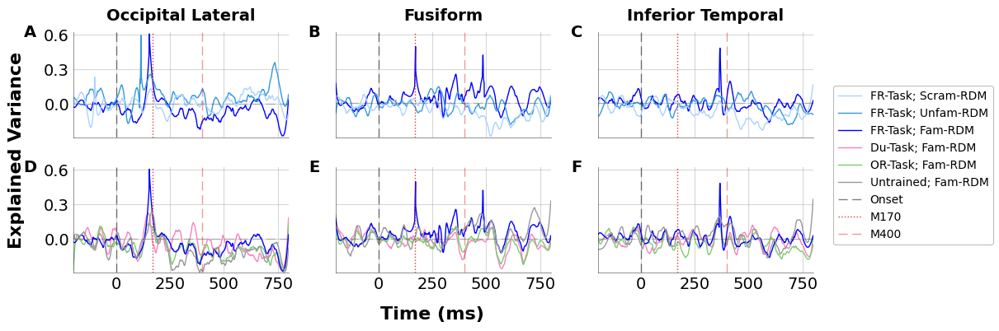

In [9]:

main_region = "occipital"
fusiform_labels = [i for i, label in enumerate(rois) if main_region in label.name.split('_')[0]]
region_name = [rois[i].name for i in fusiform_labels]
model_layes = 404
model = "FaceNet"


smoothing = "not_smoothed"
activation_types = [ "imagenet",  "imagenet", "trained",]
ann_analysis_types = [ "meg_stimuli_faces", "None", "with-meg_pretrained", ]
labels = ["Du-Task; Fam-RDM", "OR-Task; Fam-RDM", "FR-Task; Fam-RDM",]


stimuli_type = "fam"
k = 195
i = 6
min_ind = 0
max_ind = 0
colors = [ spring[1], the_blues[5], the_blues[8],  grey[2], ]
roi = region_name[i]
fig, ax = plt.subplots(figsize=(12, 4), nrows=2, ncols=4, gridspec_kw={'width_ratios': [2.834, 2.833, 2.833, 1.5]})
ax = ax.flatten()
axs = ax[0]
ann_analysis_type = "with-meg_pretrained"
activation_type = "trained"
for stimuli_type, color, label in zip(["fam", "unfamiliar", "scrambled"], colors, ["FR-Task; Fam-RDM", "FR-Task; Unfam-RDM", "FR-Task; Scram-RDM"]):
    folder = os.path.join(similarity_folder, f"{model}_with-meg_pretrained_trained_{stimuli_type}")
    file_path = os.path.join(folder, f"raw_{model}_with-meg_pretrained_{roi}_rdm_trained_{stimuli_type}.npy")
    file = np.load(file_path)
    noise_ceiling = np.load(os.path.join(similarity_folder, "noise_ceiling", f"{roi}_{stimuli_type}_upper_noise_ceiling.npy"))
    noise_ceiling = np.squeeze(noise_ceiling)
    # Get the values from file[0,:,k,0]
    file[file[:, :, :, 1] > 0.05] = 0
    values = file[0,:,k,0]
    window_size = 30 
    smoothed_values = np.zeros_like(values)
    # Create a mask for values between 170 and 200
    values = file[0,:,k,0]
    values = values / noise_ceiling
    max_ind = np.argmax(values)
    if stimuli_type == "fam":
        min_max_id = max_ind - 1
        max_max_id = max_ind + 1
        smoothed_values[min_max_id:max_max_id] = scipy.signal.savgol_filter(values[min_max_id:max_max_id], 2, 1)
        smoothed_values[:max_max_id] = scipy.signal.savgol_filter(values[:max_max_id], 100, 4)
        smoothed_values[min_max_id:] = scipy.signal.savgol_filter(values[min_max_id:], 100, 4)

    elif stimuli_type == "unfamiliar":
        min_max_id = max_ind - 8
        max_max_id = max_ind + 2
        smoothed_values[340:348] = values[340:348]
        smoothed_values[:340] = scipy.signal.savgol_filter(values[:340], 100, 4)
        smoothed_values[348:] = scipy.signal.savgol_filter(values[348:], 100, 4)

    else:
        min_max_id = max_ind - 1
        max_max_id = max_ind + 1
        smoothed_values[min_max_id:max_max_id] = scipy.signal.savgol_filter(values[min_max_id:max_max_id], 2, 1)
        smoothed_values[:max_max_id] = scipy.signal.savgol_filter(values[:max_max_id], 100, 4)
        smoothed_values[min_max_id:] = scipy.signal.savgol_filter(values[min_max_id:], 100, 4)

    # Create an array to store the smoothed values
    
    print(f"max index: {max_ind}")
    print(f"min_max_id: {min_max_id}")
    print(f"max_max_id: {max_max_id}")

    # Smooth values with indices between 170 and 200

    # Assign a value of 50 to the rest of the values
    # else:
    #     smoothed_values = scipy.signal.savgol_filter(values, 100, 4)
    axs.plot(time_values, smoothed_values, label=label, color=color, linewidth=1)
    axs.spines['bottom'].set_visible(True)
    axs.spines['left'].set_visible(True)

    print(file[0,max_ind,k,0])

axs.set_xlim(-200, 800)
# axs.set_ylim(-0.51, 0.5)
axs.grid(True, alpha=0.5)
axs.set_yticks(np.arange(-0.3, 0.62, 0.3))
axs.axvline(x=0, color='k', linestyle='--', alpha=0.5, linewidth=1, label="Onset")
axs.axhline(y=0, color='black',  alpha=0.2, linestyle="--", linewidth=1)
axs.axvline(x=170, color=one_piece[2], alpha=0.8, linestyle=":", linewidth=1, label="M170")
axs.axvline(x=400, color=one_piece[2], alpha=0.4, linestyle="--", linewidth=1, label="M400")
axs.tick_params(axis='both', which='major', labelsize=14)
bbox_props = dict(boxstyle="round, pad=0.5", edgecolor="black", facecolor="lightgrey", alpha=0.5, lw=0.5)
# axs.text(.2, 0.03, "Onset", fontsize=3, fontweight='bold', ha="center", va="center", transform=axs.transAxes, bbox=bbox_props)
# axs.text(.370, 0.03, "M170", fontsize=3, fontweight='bold', ha="center", va="center", transform=axs.transAxes, bbox=bbox_props)
# if idx == 2:
#     axs.legend(loc='upper right', title="Legend", fontsize=5, title_fontsize=5, edgecolor="grey").get_frame().set_linewidth(0.5) 
axs.xaxis.set_ticks_position('bottom')
axs.xaxis.set_tick_params(length=0)
axs.xaxis.set_ticklabels([])
axs.yaxis.set_ticks_position('left')
axs.yaxis.set_tick_params(length=0)
axs.spines['left'].set_alpha(0.6)
axs.spines['bottom'].set_alpha(0.6)
axs.spines['left'].set_color('black')
axs.spines['bottom'].set_color('black')
axs.spines['bottom'].set_linewidth(0.5)
axs.spines['left'].set_linewidth(0.5)
axs.set_ylim(-0.29, 0.62)
axs.set_title(f"Occipital Lateral", fontsize=14, fontweight='bold', y=1.05)
axs.text(-0.2, 1, "A", fontsize=14, fontweight='bold', ha="center", va="center", transform=axs.transAxes)

main_region = "fusiform"
fusiform_labels = [i for i, label in enumerate(rois) if main_region in label.name.split('_')[0]]
region_name = [rois[i].name for i in fusiform_labels]
model_layes = 404
model = "FaceNet"

k = 40
i = 14

axs = ax[1]
roi = region_name[i]
for stimuli_type, color, label in zip(["fam", "unfamiliar", "scrambled"], colors, ["FR-Task; Fam-RDM", "FR-Task; Unfam-RDM", "FR-Task; Scram-RDM"]):
    folder = os.path.join(similarity_folder, f"{model}_with-meg_pretrained_trained_{stimuli_type}")
    file_path = os.path.join(folder, f"raw_{model}_with-meg_pretrained_{roi}_rdm_trained_{stimuli_type}.npy")
    file = np.load(file_path)
    print(file.shape)
    # file[file[:, :, :, 1] > 0.05] = 0
    # Get the values from file[0,:,k,0]
    values = file[0,:,k,0]

    window_size = 30 if label == "Face Recognition" else 50
    noise_ceiling = np.load(os.path.join(similarity_folder, "noise_ceiling", f"{roi}_{stimuli_type}_upper_noise_ceiling.npy"))
    noise_ceiling = np.squeeze(noise_ceiling)
    # Create a mask for values between 170 and 200
    values = file[0,:,k,0]
    values = values / noise_ceiling
    # Create an array to store the smoothed values
    smoothed_values = np.zeros_like(values)
    max_ind = np.argmax(values)
    min_max_id = max_ind - 3
    max_max_id = max_ind + 1
    second_max = np.argmax(values[450:])
    # Create an array to store the smoothed values
    smoothed_values = np.zeros_like(values)
    if stimuli_type == "fam":
        print(f"max index: {max_ind}")
        print(f"min_max_id: {min_max_id}")
        print(f"max_max_id: {max_max_id}")
        print(f"second max: {second_max}")

    if stimuli_type == "fam":
        # Smooth values with indices between 170 and 200
        smoothed_values[min_max_id:max_max_id] = scipy.signal.savgol_filter(values[min_max_id:max_max_id], 3, 2)
        # Assign a value of 50 to the rest of the values
        smoothed_values[:min_max_id] = scipy.signal.savgol_filter(values[:min_max_id], 100, 4)
        smoothed_values[max_max_id:] = scipy.signal.savgol_filter(values[max_max_id:], 50, 4)
        smoothed_values[751:755] = scipy.signal.savgol_filter(values[751:755], 3, 2)
        smoothed_values[760:] = scipy.signal.savgol_filter(values[760:], 100, 4)

    else:
        smoothed_values = scipy.signal.savgol_filter(values, 100, 4)
    # Smooth values with indices between 170 and 200
    # smoothed_values[387:391] = values[387:391]

    # # # Assign a value of 50 to the rest of the values
    # smoothed_values[:387] = scipy.signal.savgol_filter(values[:387], 50, 4)
    # smoothed_values[391:] = scipy.signal.savgol_filter(values[391:], 50, 4)
    # smoothed_values = scipy.signal.savgol_filter(values, window_size, 4)
    # smoothed_values = values
    axs.plot(time_values, smoothed_values, label=label, color=color, linewidth=1)
    axs.spines['bottom'].set_visible(True)
    axs.spines['left'].set_visible(True)

    print(file[0,max_ind,k,0])

axs.set_xlim(-200, 800)
# axs.set_ylim(-0.51, 0.5)
axs.grid(True, alpha=0.5)
axs.set_yticks(np.arange(-0.3, 0.62, 0.3))
axs.axvline(x=0, color='k', linestyle='--', alpha=0.5, linewidth=1, label="Onset")
axs.axhline(y=0, color='black',  alpha=0.2, linestyle="--", linewidth=1)
axs.axvline(x=170, color=one_piece[2], alpha=0.8, linestyle=":", linewidth=1, label="M170")
axs.axvline(x=400, color=one_piece[2], alpha=0.4, linestyle="--", linewidth=1, label="M400")
axs.tick_params(axis='both', which='major', labelsize=14)
bbox_props = dict(boxstyle="round, pad=0.5", edgecolor="black", facecolor="lightgrey", alpha=0.5, lw=0.5)
# axs.text(.2, 0.03, "Onset", fontsize=3, fontweight='bold', ha="center", va="center", transform=axs.transAxes, bbox=bbox_props)
# axs.text(.370, 0.03, "M170", fontsize=3, fontweight='bold', ha="center", va="center", transform=axs.transAxes, bbox=bbox_props)
# axs.text(.600, 0.03, "M400", fontsize=3, fontweight='bold', ha="center", va="center", transform=axs.transAxes, bbox=bbox_props)

# if idx == 2:
#     axs.legend(loc='upper right', title="Legend", fontsize=5, title_fontsize=5, edgecolor="grey").get_frame().set_linewidth(0.5) 
axs.xaxis.set_ticks_position('bottom')
axs.xaxis.set_tick_params(length=0)
axs.xaxis.set_ticklabels([])

axs.yaxis.set_ticks_position('left')
axs.yaxis.set_tick_params(length=0)
axs.yaxis.set_ticklabels([])

axs.spines['left'].set_alpha(0.6)
axs.spines['bottom'].set_alpha(0.6)
axs.spines['left'].set_color('black')
axs.spines['bottom'].set_color('black')
axs.spines['bottom'].set_linewidth(0.5)
axs.spines['left'].set_linewidth(0.5)
axs.set_ylim(-0.30, 0.62)
axs.set_title(f"Fusiform", fontsize=14, fontweight='bold', y=1.05)
axs.text(-0.1, 1, "B", fontsize=14, fontweight='bold', ha="center", va="center", transform=axs.transAxes)




axs = ax[2]
main_region = "inferiortemporal"
fusiform_labels = [i for i, label in enumerate(rois) if main_region in label.name.split('_')[0]]
region_name = [rois[i].name for i in fusiform_labels]
model_layes = 404
model = "FaceNet"

k = 383
i = 0

roi = region_name[i]
for stimuli_type, color, label in zip(["fam", "unfamiliar", "scrambled"], colors, ["FR-Task; Fam-RDM", "FR-Task; Unfam-RDM", "FR-Task; Scram-RDM"]):
    folder = os.path.join(similarity_folder, f"{model}_with-meg_pretrained_trained_{stimuli_type}")
    file_path = os.path.join(folder, f"raw_{model}_with-meg_pretrained_{roi}_rdm_trained_{stimuli_type}.npy")
    file = np.load(file_path)
    print(file.shape)
    # file[file[:, :, :, 1] > 0.05] = 0
    # Get the values from file[0,:,k,0]
    values = file[0,:,k,0]

    window_size = 30 if label == "Face Recognition" else 50
    noise_ceiling = np.load(os.path.join(similarity_folder, "noise_ceiling", f"{roi}_{stimuli_type}_upper_noise_ceiling.npy"))
    noise_ceiling = np.squeeze(noise_ceiling)
    # Create a mask for values between 170 and 200
    values = file[0,:,k,0]
    values = values / noise_ceiling
    # Create an array to store the smoothed values
    smoothed_values = np.zeros_like(values)
    max_ind = np.argmax(values)
    min_max_id = max_ind - 3
    max_max_id = max_ind + 1
    # Create an array to store the smoothed values
    smoothed_values = np.zeros_like(values)
    if stimuli_type == "fam":
        print(f"max index: {max_ind}")
        print(f"min_max_id: {min_max_id}")
        print(f"max_max_id: {max_max_id}")

    if stimuli_type == "fam":
        # Smooth values with indices between 170 and 200
        smoothed_values[min_max_id:max_max_id] = scipy.signal.savgol_filter(values[min_max_id:max_max_id], 3, 2)
        # Assign a value of 50 to the rest of the values
        smoothed_values[:min_max_id] = scipy.signal.savgol_filter(values[:min_max_id], 100, 4)
        smoothed_values[max_max_id:] = scipy.signal.savgol_filter(values[max_max_id:], 100, 4)

    else:
        smoothed_values = scipy.signal.savgol_filter(values, 100, 4)
    # Smooth values with indices between 170 and 200
    # smoothed_values[387:391] = values[387:391]

    # # # Assign a value of 50 to the rest of the values
    # smoothed_values[:387] = scipy.signal.savgol_filter(values[:387], 50, 4)
    # smoothed_values[391:] = scipy.signal.savgol_filter(values[391:], 50, 4)
    # smoothed_values = scipy.signal.savgol_filter(values, window_size, 4)
    # smoothed_values = values
    axs.plot(time_values, smoothed_values, label=label, color=color, linewidth=1)
    axs.spines['bottom'].set_visible(True)
    axs.spines['left'].set_visible(True)

    print(file[0,max_ind,k,0])

axs.set_xlim(-200, 800)
# axs.set_ylim(-0.51, 0.5)
axs.grid(True, alpha=0.5)
axs.set_yticks(np.arange(-0.3, 0.62, 0.3))
axs.axvline(x=0, color='k', linestyle='--', alpha=0.5, linewidth=1, label="Onset")
axs.axhline(y=0, color='black',  alpha=0.2, linestyle="--", linewidth=1)
axs.axvline(x=170, color=one_piece[2], alpha=0.8, linestyle=":", linewidth=1, label="M170")
axs.axvline(x=400, color=one_piece[2], alpha=0.4, linestyle="--", linewidth=1, label="M400")
axs.tick_params(axis='both', which='major', labelsize=14)
bbox_props = dict(boxstyle="round, pad=0.5", edgecolor="black", facecolor="lightgrey", alpha=0.5, lw=0.5)
# axs.text(.2, 0.03, "Onset", fontsize=3, fontweight='bold', ha="center", va="center", transform=axs.transAxes, bbox=bbox_props)
# axs.text(.600, 0.03, "M400", fontsize=3, fontweight='bold', ha="center", va="center", transform=axs.transAxes, bbox=bbox_props)
# if idx == 2:
#     axs.legend(loc='upper right', title="Legend", fontsize=5, title_fontsize=5, edgecolor="grey").get_frame().set_linewidth(0.5) 
axs.xaxis.set_ticks_position('bottom')
axs.xaxis.set_tick_params(length=0)
axs.xaxis.set_ticklabels([])
axs.yaxis.set_ticks_position('left')
axs.yaxis.set_tick_params(length=0)
axs.yaxis.set_ticklabels([])
axs.spines['left'].set_alpha(0.6)
axs.spines['bottom'].set_alpha(0.6)
axs.spines['left'].set_color('black')
axs.spines['bottom'].set_color('black')
axs.spines['bottom'].set_linewidth(0.5)
axs.spines['left'].set_linewidth(0.5)
# axs.legend(loc='upper left', title="Legend", fontsize=5, title_fontsize=5, edgecolor="grey").get_frame().set_linewidth(0.5)
axs.set_ylim(-0.30, 0.62)
axs.set_title(f"Inferior Temporal", fontsize=14, fontweight='bold', y=1.05)
axs.text(-0.1, 1, "C", fontsize=14, fontweight='bold', ha="center", va="center", transform=axs.transAxes)


handles_1, labels_1 = axs.get_legend_handles_labels()
# fig.text(-0.01, 0.5, 'Explained Variance', ha='center', va='center', rotation='vertical', fontweight='bold', fontsize=8)
# fig.text(0.4, -0.01, 'Layer Index', ha='center', va='center', fontweight='bold', fontsize=8)
# ax[3].legend(handles, labels, loc='center left', title="Legend", fontsize=14, title_fontsize=12, edgecolor="grey").get_frame().set_linewidth(0.5)
ax[3].spines['right'].set_visible(False)
ax[3].spines['top'].set_visible(False)
ax[3].spines['left'].set_visible(False)
ax[3].spines['bottom'].set_visible(False)
ax[3].grid(False)
ax[3].tick_params(axis='both', which='both', length=0, labelbottom=False, labelleft=False)



main_region = "occipital"
fusiform_labels = [i for i, label in enumerate(rois) if main_region in label.name.split('_')[0]]
region_name = [rois[i].name for i in fusiform_labels]
model_layes = 404
model = "FaceNet"


smoothing = "not_smoothed"
activation_types = [ "imagenet",  "imagenet", "trained", "untrained", ]
ann_analysis_types = [ "meg_stimuli_faces", "None", "with-meg_pretrained", "None", ]
labels = ["Du-Task; Fam-RDM", "OR-Task; Fam-RDM", "FR-Task; Fam-RDM", "Untrained; Fam-RDM"]


stimuli_type = "fam"
k = 195
i = 6
min_ind = 0
max_ind = 0
colors = [  pink_ocean[-6], green_bull[4],spring[1], grey[2], ]
roi = region_name[i]


ax = ax.flatten()
axs = ax[-4]
for ann_analysis_type, activation_type, color, label in zip(ann_analysis_types, activation_types, colors, labels):
    folder = os.path.join(similarity_folder, f"{model}_{ann_analysis_type}_{activation_type}_{stimuli_type}")
    file_path = os.path.join(folder, f"raw_{model}_{ann_analysis_type}_{roi}_rdm_{activation_type}_{stimuli_type}.npy")
    file = np.load(file_path)
    noise_ceiling = np.load(os.path.join(similarity_folder, "noise_ceiling", f"{roi}_{stimuli_type}_upper_noise_ceiling.npy"))
    noise_ceiling = np.squeeze(noise_ceiling)
    # Get the values from file[0,:,k,0]
    file[file[:, :, :, 1] > 0.05] = 0
    values = file[0,:,k,0]
    window_size = 30 

    # Create a mask for values between 170 and 200
    values = file[0,:,k,0]
    values = values / noise_ceiling
    max_ind = np.argmax(values)
    min_max_id = max_ind - 1
    max_max_id = max_ind + 1
    # Create an array to store the smoothed values
    smoothed_values = np.zeros_like(values)
    if ann_analysis_type == "with-meg_pretrained":
        print(f"max index: {max_ind}")
        print(f"min_max_id: {min_max_id}")
        print(f"max_max_id: {max_max_id}")

        # Smooth values with indices between 170 and 200
        smoothed_values[min_max_id:max_max_id] = scipy.signal.savgol_filter(values[min_max_id:max_max_id], 2, 1)

        # Assign a value of 50 to the rest of the values
        smoothed_values[:max_max_id] = scipy.signal.savgol_filter(values[:max_max_id], 100, 4)
        smoothed_values[min_max_id:] = scipy.signal.savgol_filter(values[min_max_id:], 100, 4)
    else:
        smoothed_values = scipy.signal.savgol_filter(values, 100, 4)
    axs.plot(time_values, smoothed_values, label=label, color=color, linewidth=1)
    axs.spines['bottom'].set_visible(True)
    axs.spines['left'].set_visible(True)

    print(file[0,max_ind,k,0])

axs.set_xlim(-200, 800)
# axs.set_ylim(-0.51, 0.5)
axs.grid(True, alpha=0.5)
axs.set_yticks(np.arange(-0.3, 0.62, 0.3))
axs.axvline(x=0, color='k', linestyle='--', alpha=0.5, linewidth=1, label="Onset")
axs.axhline(y=0, color='black',  alpha=0.2, linestyle="--", linewidth=1)
axs.axvline(x=170, color=one_piece[2], alpha=0.8, linestyle=":", linewidth=1, label="M170")
axs.axvline(x=400, color=one_piece[2], alpha=0.4, linestyle="--", linewidth=1, label="M400")
axs.tick_params(axis='both', which='major', labelsize=14)
# bbox_props = dict(boxstyle="round, pad=0.5", edgecolor="black", facecolor="lightgrey", alpha=0.5, lw=0.5)
# axs.text(.2, 0.06, "Onset", fontsize=6, fontweight='bold', ha="center", va="center", transform=axs.transAxes, bbox=bbox_props)
# axs.text(.370, 0.06, "M170", fontsize=6, fontweight='bold', ha="center", va="center", transform=axs.transAxes, bbox=bbox_props)
# if idx == 2:
#     axs.legend(loc='upper right', title="Legend", fontsize=5, title_fontsize=5, edgecolor="grey").get_frame().set_linewidth(0.5) 
axs.xaxis.set_ticks_position('bottom')
axs.xaxis.set_tick_params(length=0)
axs.yaxis.set_ticks_position('left')
axs.yaxis.set_tick_params(length=0)
axs.spines['left'].set_alpha(0.6)
axs.spines['bottom'].set_alpha(0.6)
axs.spines['left'].set_color('black')
axs.spines['bottom'].set_color('black')
axs.spines['bottom'].set_linewidth(0.5)
axs.spines['left'].set_linewidth(0.5)
axs.set_ylim(-0.29, 0.62)
axs.text(-0.2, 1, "D", fontsize=14, fontweight='bold', ha="center", va="center", transform=axs.transAxes)

main_region = "fusiform"
fusiform_labels = [i for i, label in enumerate(rois) if main_region in label.name.split('_')[0]]
region_name = [rois[i].name for i in fusiform_labels]
model_layes = 404
model = "FaceNet"

k = 40
i = 14

axs = ax[-3]
roi = region_name[i]
for ann_analysis_type, activation_type, color, label in zip(ann_analysis_types, activation_types, colors, labels):
    folder = os.path.join(similarity_folder, f"{model}_{ann_analysis_type}_{activation_type}_{stimuli_type}")
    file_path = os.path.join(folder, f"raw_{model}_{ann_analysis_type}_{roi}_rdm_{activation_type}_{stimuli_type}.npy")
    file = np.load(file_path)
    print(file.shape)
    # file[file[:, :, :, 1] > 0.05] = 0
    # Get the values from file[0,:,k,0]
    values = file[0,:,k,0]

    window_size = 30 if label == "Face Recognition" else 50
    noise_ceiling = np.load(os.path.join(similarity_folder, "noise_ceiling", f"{roi}_{stimuli_type}_upper_noise_ceiling.npy"))
    noise_ceiling = np.squeeze(noise_ceiling)
    # Create a mask for values between 170 and 200
    values = file[0,:,k,0]
    values = values / noise_ceiling
    # Create an array to store the smoothed values
    smoothed_values = np.zeros_like(values)
    max_ind = np.argmax(values)
    min_max_id = max_ind - 3
    max_max_id = max_ind + 1
    # Create an array to store the smoothed values
    smoothed_values = np.zeros_like(values)
    if ann_analysis_type == "with-meg_pretrained":
        print(f"max index: {max_ind}")
        print(f"min_max_id: {min_max_id}")
        print(f"max_max_id: {max_max_id}")

    if ann_analysis_type == "with-meg_pretrained":
        # Smooth values with indices between 170 and 200
        smoothed_values[min_max_id:max_max_id] = scipy.signal.savgol_filter(values[min_max_id:max_max_id], 3, 2)
        # Assign a value of 50 to the rest of the values
        smoothed_values[:min_max_id] = scipy.signal.savgol_filter(values[:min_max_id], 100, 4)
        smoothed_values[max_max_id:] = scipy.signal.savgol_filter(values[max_max_id:], 50, 4)
        smoothed_values[751:755] = scipy.signal.savgol_filter(values[751:755], 3, 2)
        smoothed_values[760:] = scipy.signal.savgol_filter(values[760:], 100, 4)

    else:
        smoothed_values = scipy.signal.savgol_filter(values, 100, 4)
    # Smooth values with indices between 170 and 200
    # smoothed_values[387:391] = values[387:391]

    # # # Assign a value of 50 to the rest of the values
    # smoothed_values[:387] = scipy.signal.savgol_filter(values[:387], 50, 4)
    # smoothed_values[391:] = scipy.signal.savgol_filter(values[391:], 50, 4)
    # smoothed_values = scipy.signal.savgol_filter(values, window_size, 4)
    # smoothed_values = values
    axs.plot(time_values, smoothed_values, label=label, color=color, linewidth=1)
    axs.spines['bottom'].set_visible(True)
    axs.spines['left'].set_visible(True)

    print(file[0,max_ind,k,0])

axs.set_xlim(-200, 800)
# axs.set_ylim(-0.51, 0.5)
axs.grid(True, alpha=0.5)
axs.set_yticks(np.arange(-0.3, 0.62, 0.3))
axs.axvline(x=0, color='k', linestyle='--', alpha=0.5, linewidth=1, label="Onset")
axs.axhline(y=0, color='black',  alpha=0.2, linestyle="--", linewidth=1)
axs.axvline(x=170, color=one_piece[2], alpha=0.8, linestyle=":", linewidth=1, label="M170")
axs.axvline(x=400, color=one_piece[2], alpha=0.4, linestyle="--", linewidth=1, label="M400")
axs.tick_params(axis='both', which='major', labelsize=14)
bbox_props = dict(boxstyle="round, pad=0.5", edgecolor="black", facecolor="lightgrey", alpha=0.5, lw=0.5)
# axs.text(.2, 0.06, "Onset", fontsize=6, fontweight='bold', ha="center", va="center", transform=axs.transAxes, bbox=bbox_props)
# axs.text(.370, 0.06, "M170", fontsize=6, fontweight='bold', ha="center", va="center", transform=axs.transAxes, bbox=bbox_props)
# axs.axvline(x=400, color=one_piece[-3], alpha=0.4, linestyle="--", linewidth=1)
# axs.text(.600, 0.06, "M400", fontsize=6, fontweight='bold', ha="center", va="center", transform=axs.transAxes, bbox=bbox_props)

# if idx == 2:
#     axs.legend(loc='upper right', title="Legend", fontsize=5, title_fontsize=5, edgecolor="grey").get_frame().set_linewidth(0.5) 
axs.xaxis.set_ticks_position('bottom')
axs.xaxis.set_tick_params(length=0)
axs.yaxis.set_ticks_position('left')
axs.yaxis.set_tick_params(length=0)
axs.yaxis.set_ticklabels([])

axs.spines['left'].set_alpha(0.6)
axs.spines['bottom'].set_alpha(0.6)
axs.spines['left'].set_color('black')
axs.spines['bottom'].set_color('black')
axs.spines['bottom'].set_linewidth(0.5)
axs.spines['left'].set_linewidth(0.5)
axs.set_ylim(-0.30, 0.62)
axs.text(-0.1, 1, "E", fontsize=14, fontweight='bold', ha="center", va="center", transform=axs.transAxes)




axs = ax[-2]
main_region = "inferiortemporal"
fusiform_labels = [i for i, label in enumerate(rois) if main_region in label.name.split('_')[0]]
region_name = [rois[i].name for i in fusiform_labels]
model_layes = 404
model = "FaceNet"

k = 383
i = 0

roi = region_name[i]
for ann_analysis_type, activation_type, color, label in zip(ann_analysis_types, activation_types, colors, labels):
    folder = os.path.join(similarity_folder, f"{model}_{ann_analysis_type}_{activation_type}_{stimuli_type}")
    file_path = os.path.join(folder, f"raw_{model}_{ann_analysis_type}_{roi}_rdm_{activation_type}_{stimuli_type}.npy")
    file = np.load(file_path)
    print(file.shape)
    # file[file[:, :, :, 1] > 0.05] = 0
    # Get the values from file[0,:,k,0]
    values = file[0,:,k,0]

    window_size = 30 if label == "Face Recognition" else 50
    noise_ceiling = np.load(os.path.join(similarity_folder, "noise_ceiling", f"{roi}_{stimuli_type}_upper_noise_ceiling.npy"))
    noise_ceiling = np.squeeze(noise_ceiling)
    # Create a mask for values between 170 and 200
    values = file[0,:,k,0]
    values = values / noise_ceiling
    # Create an array to store the smoothed values
    smoothed_values = np.zeros_like(values)
    max_ind = np.argmax(values)
    min_max_id = max_ind - 3
    max_max_id = max_ind + 1
    # Create an array to store the smoothed values
    smoothed_values = np.zeros_like(values)
    if ann_analysis_type == "with-meg_pretrained":
        print(f"max index: {max_ind}")
        print(f"min_max_id: {min_max_id}")
        print(f"max_max_id: {max_max_id}")

    if ann_analysis_type == "with-meg_pretrained":
        # Smooth values with indices between 170 and 200
        smoothed_values[min_max_id:max_max_id] = scipy.signal.savgol_filter(values[min_max_id:max_max_id], 3, 2)
        # Assign a value of 50 to the rest of the values
        smoothed_values[:min_max_id] = scipy.signal.savgol_filter(values[:min_max_id], 100, 4)
        smoothed_values[max_max_id:] = scipy.signal.savgol_filter(values[max_max_id:], 100, 4)

    else:
        smoothed_values = scipy.signal.savgol_filter(values, 100, 4)
    # Smooth values with indices between 170 and 200
    # smoothed_values[387:391] = values[387:391]

    # # # Assign a value of 50 to the rest of the values
    # smoothed_values[:387] = scipy.signal.savgol_filter(values[:387], 50, 4)
    # smoothed_values[391:] = scipy.signal.savgol_filter(values[391:], 50, 4)
    # smoothed_values = scipy.signal.savgol_filter(values, window_size, 4)
    # smoothed_values = values
    axs.plot(time_values, smoothed_values, label=label, color=color, linewidth=1)
    axs.spines['bottom'].set_visible(True)
    axs.spines['left'].set_visible(True)

    print(file[0,max_ind,k,0])

axs.set_xlim(-200, 800)
# axs.set_ylim(-0.51, 0.5)
axs.set_yticks(np.arange(-0.3, 0.62, 0.3))

axs.grid(True, alpha=0.5)

axs.axvline(x=0, color='k', linestyle='--', alpha=0.5, linewidth=1, label="Onset")
axs.axhline(y=0, color='black',  alpha=0.2, linestyle="--", linewidth=1)
axs.axvline(x=170, color=one_piece[2], alpha=0.8, linestyle=":", linewidth=1, label="M170")
axs.axvline(x=400, color=one_piece[2], alpha=0.4, linestyle="--", linewidth=1, label="M400")
axs.tick_params(axis='both', which='major', labelsize=14)

# bbox_props = dict(boxstyle="round, pad=0.5", edgecolor="black", facecolor="lightgrey", alpha=0.5, lw=0.5)
# axs.text(.2, 0.06, "Onset", fontsize=6, fontweight='bold', ha="center", va="center", transform=axs.transAxes, bbox=bbox_props)
# axs.text(.600, 0.06, "M400", fontsize=6, fontweight='bold', ha="center", va="center", transform=axs.transAxes, bbox=bbox_props)
# if idx == 2:
#     axs.legend(loc='upper right', title="Legend", fontsize=5, title_fontsize=5, edgecolor="grey").get_frame().set_linewidth(0.5) 
axs.xaxis.set_ticks_position('bottom')
axs.xaxis.set_tick_params(length=0)
axs.yaxis.set_ticks_position('left')
axs.yaxis.set_tick_params(length=0)
axs.yaxis.set_ticklabels([])

axs.spines['left'].set_alpha(0.6)
axs.spines['bottom'].set_alpha(0.6)
axs.spines['left'].set_color('black')
axs.spines['bottom'].set_color('black')
axs.spines['bottom'].set_linewidth(0.5)
axs.spines['left'].set_linewidth(0.5)

# axs.legend(loc='upper left', title="Legend", fontsize=5, title_fontsize=5, edgecolor="grey").get_frame()
axs.set_ylim(-0.30, 0.62)
axs.text(-0.1, 1, "F", fontsize=14, fontweight='bold', ha="center", va="center", transform=axs.transAxes)

# axs.spines['bottom'].set_color('black')
# axs.spines['left'].set_color('black')
handles, labels = axs.get_legend_handles_labels()
handles.pop(2)
labels.pop(2)
combined_handles = handles_1[:3][::-1] + handles
combined_labels = labels_1[:3][::-1] + labels
# fig.text(-0.01, 0.5, 'Explained Variance', ha='center', va='center', rotation='vertical', fontweight='bold', fontsize=8)
# fig.text(0.4, -0.01, 'Layer Index', ha='center', va='center', fontweight='bold', fontsize=8)
ax[-1].spines['right'].set_visible(False)
ax[-1].spines['top'].set_visible(False)
ax[-1].spines['left'].set_visible(False)
ax[-1].spines['bottom'].set_visible(False)
ax[-1].grid(False)
ax[-1].tick_params(axis='both', which='both', length=0, labelbottom=False, labelleft=False)
fig.text(0.01, 0.5, 'Explained Variance', ha='center', va='center', rotation='vertical', fontweight='bold', fontsize=16)
fig.text(0.43, 0.0, 'Time (ms)', ha='center', va='center', fontweight='bold', fontsize=16)
fig.legend(combined_handles, combined_labels, loc='center right', fontsize=10, edgecolor="grey").get_frame().set_linewidth(0.5)


plt.tight_layout()

# axs.set_title(f"Similarity Scores for {model} {k}th Layer and {roi} ROI", fontsize=20, fontweight='bold')
# Save the plot in a  png file
plt.savefig(f"{plots_folder}/final/combined.pdf", format="pdf", bbox_inches='tight', dpi=300)
plt.show()


In [489]:
model ="FaceNet"
activation_type = "trained"
ann_analysis_type = "with-meg_pretrained"
stimuli_type = "fam"
values = []
layer = 40
id = 408
for roi in rois:
    roi_name = roi.name
    folder = os.path.join(similarity_folder, f"{model}_{ann_analysis_type}_{activation_type}_{stimuli_type}")
    try:
        file_path = os.path.join(folder, f"raw_{model}_{ann_analysis_type}_{roi_name}_rdm_{activation_type}_{stimuli_type}.npy")
        data = np.load(file_path)
        noise_ceiling = np.load(os.path.join(similarity_folder, "noise_ceiling", f"{roi_name}_{stimuli_type}_upper_noise_ceiling.npy"))
        noise_ceiling = np.squeeze(noise_ceiling)
        values.append(data[0,id,layer,0] / noise_ceiling[id])
    except:
        print(f"Error in {roi_name}")
        values.append(0)
        continue
print(len(values))


# # data[data[:, :, :, 1] > 0.05] = 0
# values = np.max(data[:, 2, :, 0], axis=1)
# max_values = np.max(data[:, 2, :, 0], axis=0)
# max_values_idx_layer = np.argmax(max_values)
# brain_values = data[:, 2, max_values_idx_layer, 0]
# noise_ceiling = np.load(os.path.join(similarity_folder, f"meg_{stimuli_type}_upper_noise_ceiling_{time_segment}_50.npy"))
# values = brain_values[:, np.newaxis] / noise_ceiling
# min_values = np.min(data[:, 2, :, 0], axis=1)
# values = np.squeeze(values)

Error in bankssts_1-lh
Error in inferiortemporal_7-rh
Error in pericalcarine_3-lh
Error in superiorparietal_8-rh
Error in unknown-lh
Error in unknown-rh
450


In [490]:
print(max(values))

0.4958631246217952


In [491]:
from mne.viz import Brain
brain = Brain(
        subject='fsaverage', subjects_dir=subjects_dir, surf="inflated", hemi="split",  background='white', size=(800, 800)
)
labels_lh = np.zeros(len(brain.geo["lh"].coords), dtype=int)
labels_rh = np.zeros(len(brain.geo["rh"].coords), dtype=int)
ctab_lh = list()
ctab_rh = list()
for i, (roi, value) in enumerate(zip(rois, values), 1):
    if roi.hemi == "lh":
        labels = labels_lh
        ctab = ctab_lh
    else:
        labels = labels_rh
        ctab = ctab_rh
    labels[roi.vertices] = i
    if roi.name in ["unknown-rh", "unknown-lh"]:
        ctab.append([128, 128, 128, 255, i])
    else:
        ctab.append([int(x * 255) for x in cmap_2.to_rgba(value)] + [i])

ctab_lh = np.array(ctab_lh)
ctab_rh = np.array(ctab_rh)

In [492]:
brain.add_annotation(
[(labels_lh, ctab_lh), (labels_rh, ctab_rh)], borders=False, alpha=1.0, remove_existing=True
)
brain.show_view("ventral") #caudal, ventral 
# Get screenshot and crop it
screenshot = brain.screenshot()
nonwhite_pix = (screenshot != 255).any(-1)
nonwhite_row = nonwhite_pix.any(1)
nonwhite_col = nonwhite_pix.any(0)
cropped_screenshot = screenshot[nonwhite_row][:, nonwhite_col]
list_views[f"{ann_analysis_type} {activation_type} {stimuli_type} ventral {layer} {id}"] = cropped_screenshot
list(list_views.keys())

['with-meg_pretrained trained fam caudal 195 389',
 'meg_stimuli_faces imagenet fam caudal 195 389',
 'None imagenet fam caudal 195 389',
 'None untrained fam caudal 195 389',
 'None untrained unfamiliar caudal 195 346',
 'with-meg_pretrained trained unfamiliar caudal 195 346',
 'meg_stimuli_faces imagenet unfamiliar caudal 195 346',
 'None imagenet unfamiliar caudal 195 346',
 'None imagenet unfamiliar caudal 40 408',
 'with-meg_pretrained trained fam caudal 40 408',
 'with-meg_pretrained trained fam caudal 40 700',
 'with-meg_pretrained trained fam caudal 40 618',
 'with-meg_pretrained trained fam caudal 40 753',
 'with-meg_pretrained trained fam caudal 383 623',
 'with-meg_pretrained trained fam ventral 40 753',
 'with-meg_pretrained trained fam ventral 40 408']

In [425]:
# list_views = dict()

In [636]:
import pickle
with open(f"list_views_ccn.pkl", "wb") as f:
    pickle.dump(list_views, f)

In [20]:
import pickle
with open(f"list_views_ccn.pkl", "rb") as f:
    list_views = pickle.load(f)

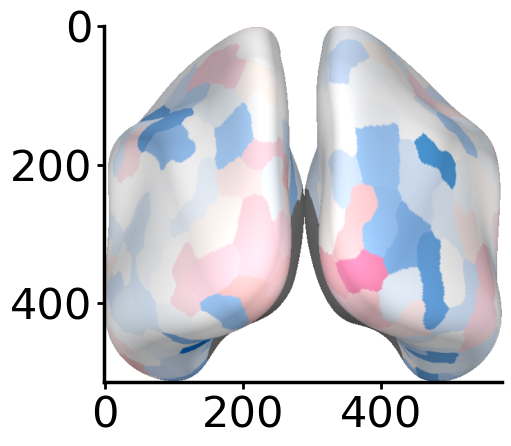

In [442]:
plt.imshow(cropped_screenshot)
plt.grid(False)

In [493]:
1.666*2

3.332

/var/folders/dy/yqsbvh6j7r7gz1ktnr8gx4g80000gn/T/ipykernel_2078/3401946977.py:85: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(f"{plots_folder}/final/combined_brain.pdf", format="pdf", bbox_inches='tight', dpi=300)
/var/folders/dy/yqsbvh6j7r7gz1ktnr8gx4g80000gn/T/ipykernel_2078/3401946977.py:85: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(f"{plots_folder}/final/combined_brain.pdf", format="pdf", bbox_inches='tight', dpi=300)
/Users/hamzaabdelhedi/Projects/Master_project/venv11/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


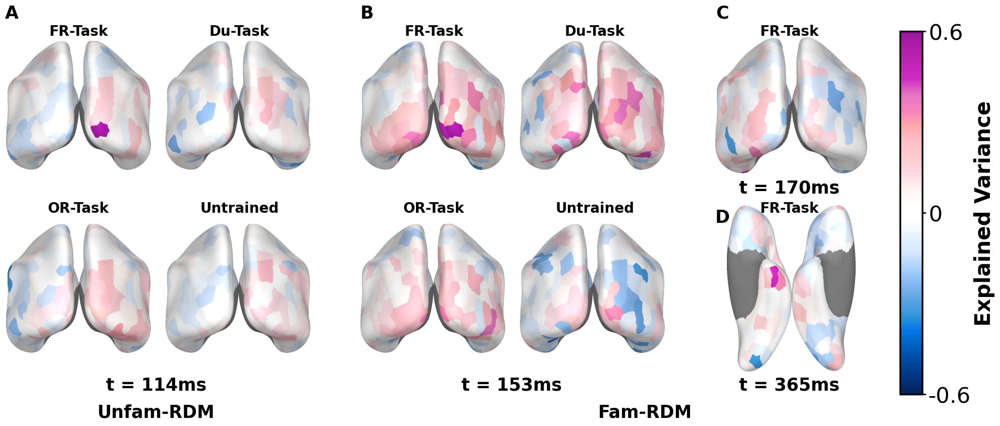

In [21]:
import matplotlib.gridspec as gridspec
from matplotlib.colors import Normalize

# fig, ax = plt.subplots(figsize=(12, 4), nrows=1, ncols=4, gridspec_kw={'width_ratios': [3.332, 3.332, 1.666,]})
fig = plt.figure(figsize=(22, 9))
outer = gridspec.GridSpec(1, 3, wspace=0.2, hspace=0.2, width_ratios=[4, 4, 2])

inner = gridspec.GridSpecFromSubplotSpec(2, 2, subplot_spec=outer[0], wspace=0.1, hspace=0.1)
ax = plt.Subplot(fig, inner[0])
ax.imshow(list_views['with-meg_pretrained trained unfamiliar caudal 195 346'])
ax.axis('off')
fig.add_subplot(ax)
ax = plt.Subplot(fig, inner[1])
ax.imshow(list_views['meg_stimuli_faces imagenet unfamiliar caudal 195 346'])
ax.axis('off')
fig.add_subplot(ax)
ax = plt.Subplot(fig, inner[2])
ax.imshow(list_views['None imagenet unfamiliar caudal 195 346'])
ax.axis('off')
fig.add_subplot(ax)
ax = plt.Subplot(fig, inner[3])
ax.imshow(list_views['None untrained unfamiliar caudal 195 346'])
ax.axis('off')
fig.add_subplot(ax)

inner = gridspec.GridSpecFromSubplotSpec(2, 2, subplot_spec=outer[1], wspace=0.1, hspace=0.1)
ax = plt.Subplot(fig, inner[0])
ax.imshow(list_views['with-meg_pretrained trained fam caudal 195 389'])
ax.axis('off')
fig.add_subplot(ax)
ax = plt.Subplot(fig, inner[1])
ax.imshow(list_views['meg_stimuli_faces imagenet fam caudal 195 389'])
ax.axis('off')
fig.add_subplot(ax)
ax = plt.Subplot(fig, inner[2])
ax.imshow(list_views['None imagenet fam caudal 195 389'])
ax.axis('off')
fig.add_subplot(ax)
ax = plt.Subplot(fig, inner[3])
ax.imshow(list_views['None untrained fam caudal 195 389'])
ax.axis('off')
fig.add_subplot(ax)

inner = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer[2], wspace=0.1, hspace=0.1)
ax = plt.Subplot(fig, inner[0])
ax.imshow(list_views['with-meg_pretrained trained fam caudal 40 408'])
ax.axis('off')
fig.add_subplot(ax)
ax = plt.Subplot(fig, inner[1])
ax.imshow(list_views['with-meg_pretrained trained fam caudal 383 623'])
ax.axis('off')
fig.add_subplot(ax)


cbar_ax = fig.add_axes([0.93, 0.06, 0.02, 0.8])
norm = Normalize(vmin=-0.6, vmax=6)
cbar = plt.colorbar(cmap_2, cax=cbar_ax, ticks=[-0.62, 0, 0.62])
cbar.set_ticklabels(['-0.6', '0', '0.6'])
cbar.set_label('Explained Variance', fontsize=30, fontweight='bold') 

fig.text(0.13, 0.9, 'A', ha='center', va='center', fontweight='bold', fontsize=25)
fig.text(0.26, 0.08, 't = 114ms', ha='center', va='center', fontweight='bold', fontsize=25)
fig.text(0.26, 0.02, 'Unfam-RDM', ha='center', va='center', fontweight='bold', fontsize=25)
fig.text(0.19, 0.86, 'FR-Task', ha='center', va='center', fontweight='bold', fontsize=20)
fig.text(0.335, 0.86, 'Du-Task', ha='center', va='center', fontweight='bold', fontsize=20)
fig.text(0.19, 0.47, 'OR-Task', ha='center', va='center', fontweight='bold', fontsize=20)
fig.text(0.335, 0.47, 'Untrained', ha='center', va='center', fontweight='bold', fontsize=20)

fig.text(0.45, 0.9, 'B', ha='center', va='center', fontweight='bold', fontsize=25)
fig.text(0.58, 0.08, 't = 153ms', ha='center', va='center', fontweight='bold', fontsize=25)
fig.text(0.51, 0.86, 'FR-Task', ha='center', va='center', fontweight='bold', fontsize=20)
fig.text(0.655, 0.86, 'Du-Task', ha='center', va='center', fontweight='bold', fontsize=20)
fig.text(0.51, 0.47, 'OR-Task', ha='center', va='center', fontweight='bold', fontsize=20)
fig.text(0.655, 0.47, 'Untrained', ha='center', va='center', fontweight='bold', fontsize=20)

fig.text(0.77, 0.9, 'C', ha='center', va='center', fontweight='bold', fontsize=25)
fig.text(0.83, 0.515, 't = 170ms', ha='center', va='center', fontweight='bold', fontsize=25)
fig.text(0.83, 0.86, 'FR-Task', ha='center', va='center', fontweight='bold', fontsize=20)

fig.text(0.77, 0.45, 'D', ha='center', va='center', fontweight='bold', fontsize=25)
fig.text(0.83, 0.08, 't = 365ms', ha='center', va='center', fontweight='bold', fontsize=25)
fig.text(0.70, 0.02, 'Fam-RDM', ha='center', va='center', fontweight='bold', fontsize=25)
fig.text(0.83, 0.47, 'FR-Task', ha='center', va='center', fontweight='bold', fontsize=20)

plt.savefig(f"{plots_folder}/final/combined_brain.pdf", format="pdf", bbox_inches='tight', dpi=300)


In [588]:
(623*1000)/1101 - 200

365.8492279745685

/var/folders/dy/yqsbvh6j7r7gz1ktnr8gx4g80000gn/T/ipykernel_72841/2359224396.py:30: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


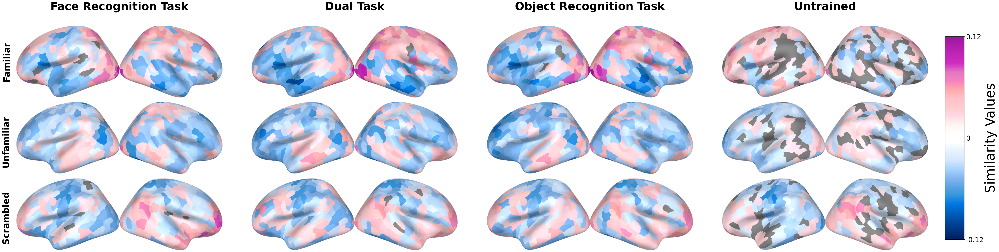

In [310]:
from matplotlib.colors import Normalize

fig, axs = plt.subplots(3, 4, figsize=(60, 16))
for i , stimuli_type in enumerate(["fam", "unfamiliar", "scrambled"]):
    for j, ann_analysis_type in enumerate(["with-meg_pretrained trained", "meg_stimuli_faces imagenet", "None imagenet",  "None untrained"]):
        axs[i, j].imshow(list_views[ann_analysis_type + " " + stimuli_type + " lateral"])
        axs[i, j].axis('off')


# # Add labels for each subplot
axs[0, 0].set_title('Face Recognition Task', fontsize=50, fontweight='bold', y=1.2)
axs[0, 1].set_title('Dual Task', fontsize=50, fontweight='bold', y=1.2)
axs[0, 2].set_title('Object Recognition Task', fontsize=50, fontweight='bold', y=1.2)
axs[0, 3].set_title('Untrained', fontsize=50, fontweight='bold', y=1.2)

ax2 = fig.add_axes([0.017, 0.665, 0.02, 0.2])
ax2.axis('off')
ax2.set_title('Familiar', fontsize=40, fontweight='bold', rotation='vertical', y=0.1, x = -0.05)
axs[1, 0].set_title('Unfamiliar', fontsize=40, fontweight='bold', rotation='vertical', y=0.1, x = -0.05)
axs[2, 0].set_title('Scrambled', fontsize=40, fontweight='bold', rotation='vertical', y=0.1, x = -0.05)


cbar_ax = fig.add_axes([1, 0.06, 0.02, 0.8])
norm = Normalize(vmin=-max_val, vmax=max_val)
cbar = plt.colorbar(cmap_2, cax=cbar_ax, ticks=[-0.1164, 0, 0.1164])
cbar.set_ticklabels(['-0.12', '0', '0.12'])
cbar.set_label('Similarity Values', fontsize=80) 

# Adjust layout and display the plot
plt.tight_layout()
plt.savefig(os.path.join(plots_folder, f'FaceNet_brain_maps_lateral.png'), dpi=300)
plt.show()



/var/folders/dy/yqsbvh6j7r7gz1ktnr8gx4g80000gn/T/ipykernel_72841/2215677381.py:30: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


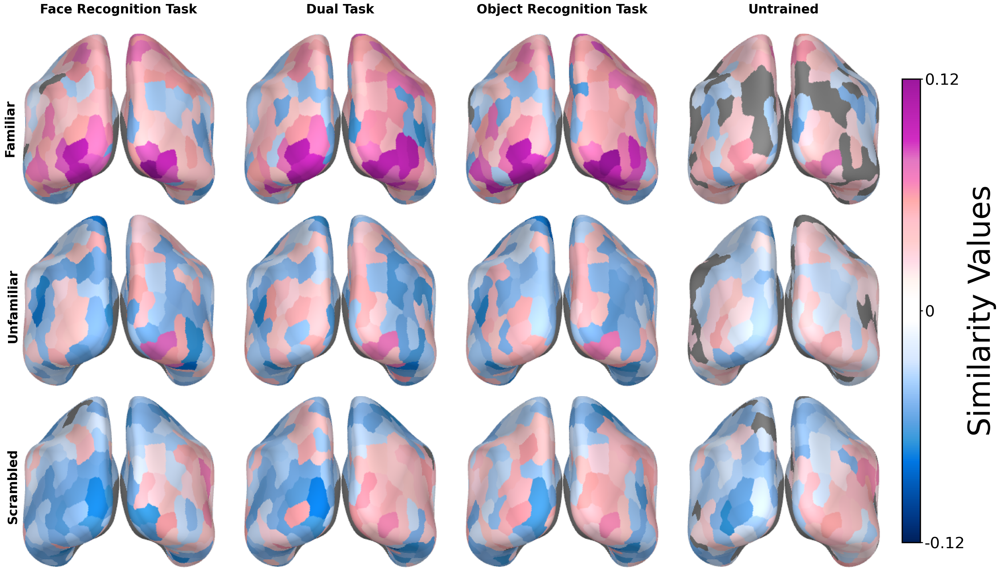

In [358]:
from matplotlib.colors import Normalize

fig, axs = plt.subplots(3, 4, figsize=(25, 16))
for i , stimuli_type in enumerate(["fam", "unfamiliar", "scrambled"]):
    for j, ann_analysis_type in enumerate(["with-meg_pretrained trained", "meg_stimuli_faces imagenet", "None imagenet",  "None untrained"]):
        axs[i, j].imshow(list_views[ann_analysis_type + " " + stimuli_type + " caudal"])
        axs[i, j].axis('off')


# # Add labels for each subplot
axs[0, 0].set_title('Face Recognition Task', fontsize=25, fontweight='bold', y=1.1)
axs[0, 1].set_title('Dual Task', fontsize=25, fontweight='bold', y=1.1)
axs[0, 2].set_title('Object Recognition Task', fontsize=25, fontweight='bold', y=1.1)
axs[0, 3].set_title('Untrained', fontsize=25, fontweight='bold', y=1.1)

ax2 = fig.add_axes([0.017, 0.665, 0.02, 0.2])
ax2.axis('off')
ax2.set_title('Familiar', fontsize=25, fontweight='bold', rotation='vertical', y=0.3, x = -0.05)
axs[1, 0].set_title('Unfamiliar', fontsize=25, fontweight='bold', rotation='vertical', y=0.25, x = -0.05)
axs[2, 0].set_title('Scrambled', fontsize=25, fontweight='bold', rotation='vertical', y=0.25, x = -0.05)


cbar_ax = fig.add_axes([1, 0.06, 0.02, 0.8])
norm = Normalize(vmin=-max_val, vmax=max_val)
cbar = plt.colorbar(cmap_2, cax=cbar_ax, ticks=[-0.1164, 0, 0.1164])
cbar.set_ticklabels(['-0.12', '0', '0.12'])
cbar.set_label('Similarity Values', fontsize=80) 

# Adjust layout and display the plot
plt.tight_layout()
plt.savefig(os.path.join(plots_folder, f'FaceNet_brain_maps_caudal.png'), dpi=300)
plt.show()



/var/folders/dy/yqsbvh6j7r7gz1ktnr8gx4g80000gn/T/ipykernel_72841/2002116778.py:30: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


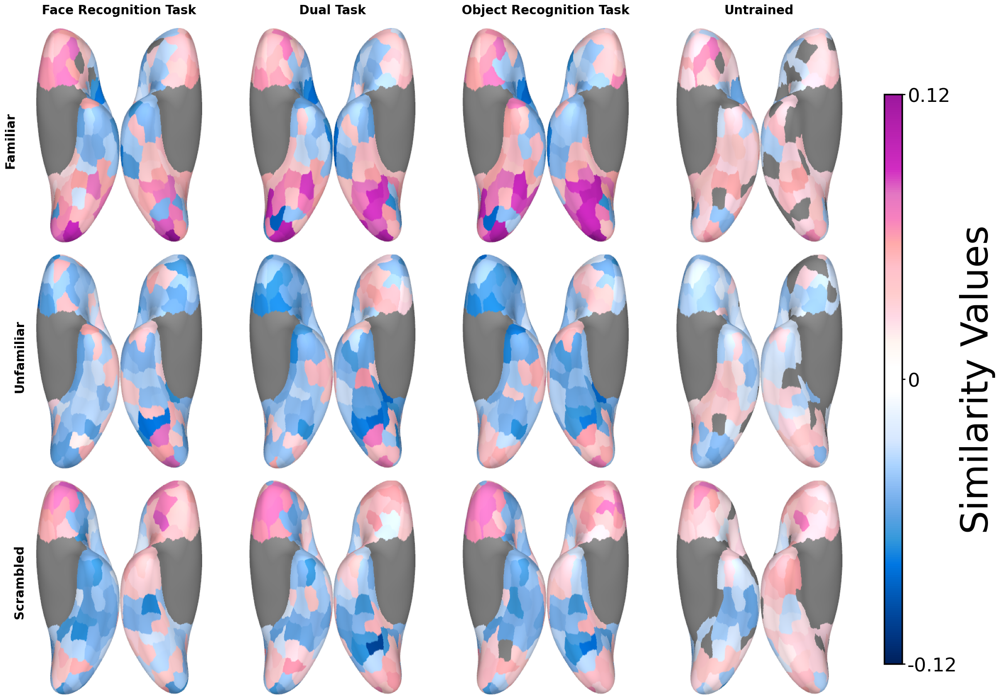

In [368]:
from matplotlib.colors import Normalize

fig, axs = plt.subplots(3, 4, figsize=(20, 16))
for i , stimuli_type in enumerate(["fam", "unfamiliar", "scrambled"]):
    for j, ann_analysis_type in enumerate(["with-meg_pretrained trained", "meg_stimuli_faces imagenet", "None imagenet",  "None untrained"]):
        axs[i, j].imshow(list_views[ann_analysis_type + " " + stimuli_type + " ventral"])
        axs[i, j].axis('off')


# # Add labels for each subplot
axs[0, 0].set_title('Face Recognition Task', fontsize=20, fontweight='bold', y=1.05)
axs[0, 1].set_title('Dual Task', fontsize=20, fontweight='bold', y=1.05)
axs[0, 2].set_title('Object Recognition Task', fontsize=20, fontweight='bold', y=1.05)
axs[0, 3].set_title('Untrained', fontsize=20, fontweight='bold', y=1.05)

ax2 = fig.add_axes([0.017, 0.665, 0.02, 0.2])
ax2.axis('off')
ax2.set_title('Familiar', fontsize=20, fontweight='bold', rotation='vertical', y=0.45, x = 0.1)
axs[1, 0].set_title('Unfamiliar', fontsize=20, fontweight='bold', rotation='vertical', y=0,31, x = -0.1)
axs[2, 0].set_title('Scrambled', fontsize=20, fontweight='bold', rotation='vertical', y=0,31, x = -0.1)


cbar_ax = fig.add_axes([1, 0.06, 0.02, 0.8])
norm = Normalize(vmin=-max_val, vmax=max_val)
cbar = plt.colorbar(cmap_2, cax=cbar_ax, ticks=[-0.1164, 0, 0.1164])
cbar.set_ticklabels(['-0.12', '0', '0.12'])
cbar.set_label('Similarity Values', fontsize=80) 

# Adjust layout and display the plot
plt.tight_layout()
plt.savefig(os.path.join(plots_folder, f'FaceNet_brain_maps_ventral.png'), dpi=300)
plt.show()



In [19]:
# Extract fusiform region data
fusiform_labels = [i for i, label in enumerate(rois) if "fusiform" in label.name.split('_')[0]]
region_name = [rois[i].name for i in fusiform_labels]


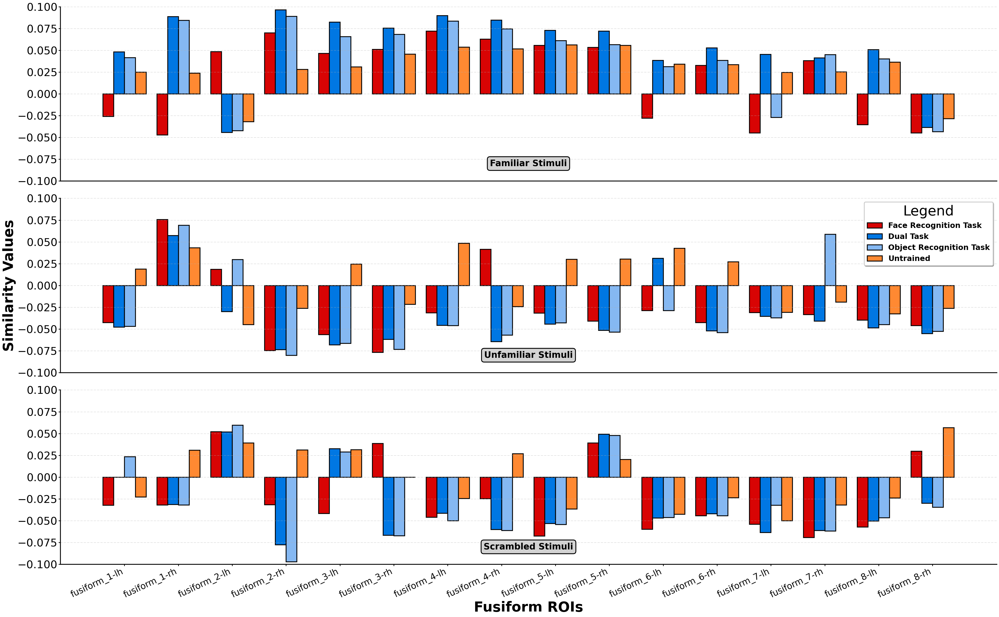

In [21]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]

time_segment = 550
sampling_diff = 50
colors = [one_piece[2],  pink_ocean[4], pink_ocean[7], one_piece[3],pink_ocean[-2], pink_ocean[-5], pink_ocean[-8]]
# colors = [one_piece[0], one_piece[2], one_piece[12], one_piece[-1]]
fig, ax = plt.subplots(3, 1, figsize=(40, 25))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        sim_values.append(values[fusiform_labels])
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    axs[stimuli_idx].set_ylim(-0.10, 0.10)
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=40, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=40, title_fontsize=40, shadow=True, fancybox=True, prop={'weight':'bold'})
    axs[stimuli_idx].set_xticks(np.arange(len(fusiform_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('Fusiform ROIs', fontsize=40, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in fusiform_labels], fontsize=25, rotation=25, ha="right")
    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)
        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        pass
        # axs[stimuli_idx].set_title(f'Similarity Values for Fusiform ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].grid(axis="y", linestyle='--', alpha=0.7)
for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
plt.savefig(os.path.join(plots_folder, "final",f'FaceNet_fusiform_similarity_values.png'), dpi=300)
plt.show()

In [17]:
# Extract occipital region data
occipital_labels = [i for i, label in enumerate(rois) if "occipital" in label.name.split('_')[0]]
region_name = [rois[i].name for i in occipital_labels]

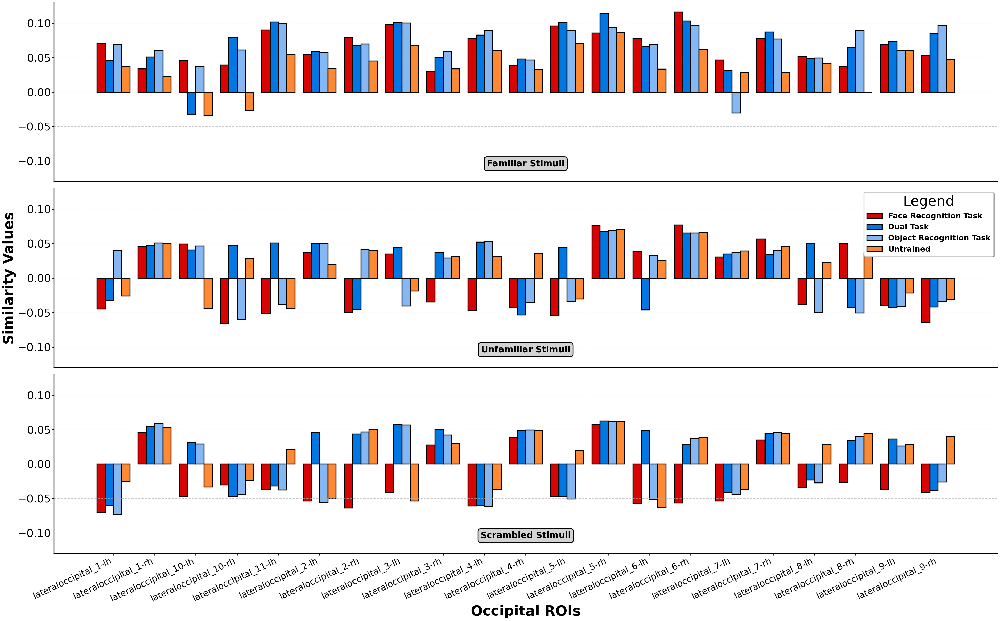

In [18]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]

time_segment = 550
sampling_diff = 50
colors = [one_piece[2],  pink_ocean[4], pink_ocean[7], one_piece[3],pink_ocean[-2], pink_ocean[-5], pink_ocean[-8]]
# colors = [one_piece[0], one_piece[2], one_piece[12], one_piece[-1]]
fig, ax = plt.subplots(3, 1, figsize=(40, 25))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        sim_values.append(values[occipital_labels])
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    axs[stimuli_idx].set_ylim(-0.13, 0.13)
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=40, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=40, title_fontsize=40, shadow=True, fancybox=True, prop={'weight':'bold'})
    axs[stimuli_idx].set_xticks(np.arange(len(occipital_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('Occipital ROIs', fontsize=40, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in occipital_labels], fontsize=25, rotation=25, ha="right")
    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)
        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        pass
        # axs[stimuli_idx].set_title(f'Similarity Values for Occipital ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].grid(axis="y", linestyle='--', alpha=0.7)
for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
plt.savefig(os.path.join(plots_folder, "final", f'FaceNet_occipital_similarity_values.png'), dpi=300)
plt.show()

In [12]:
# Extract IT region data
inferiortemporal_labels = [i for i, label in enumerate(rois) if "inferiortemporal" in label.name.split('_')[0]]
region_name = [rois[i].name for i in inferiortemporal_labels]

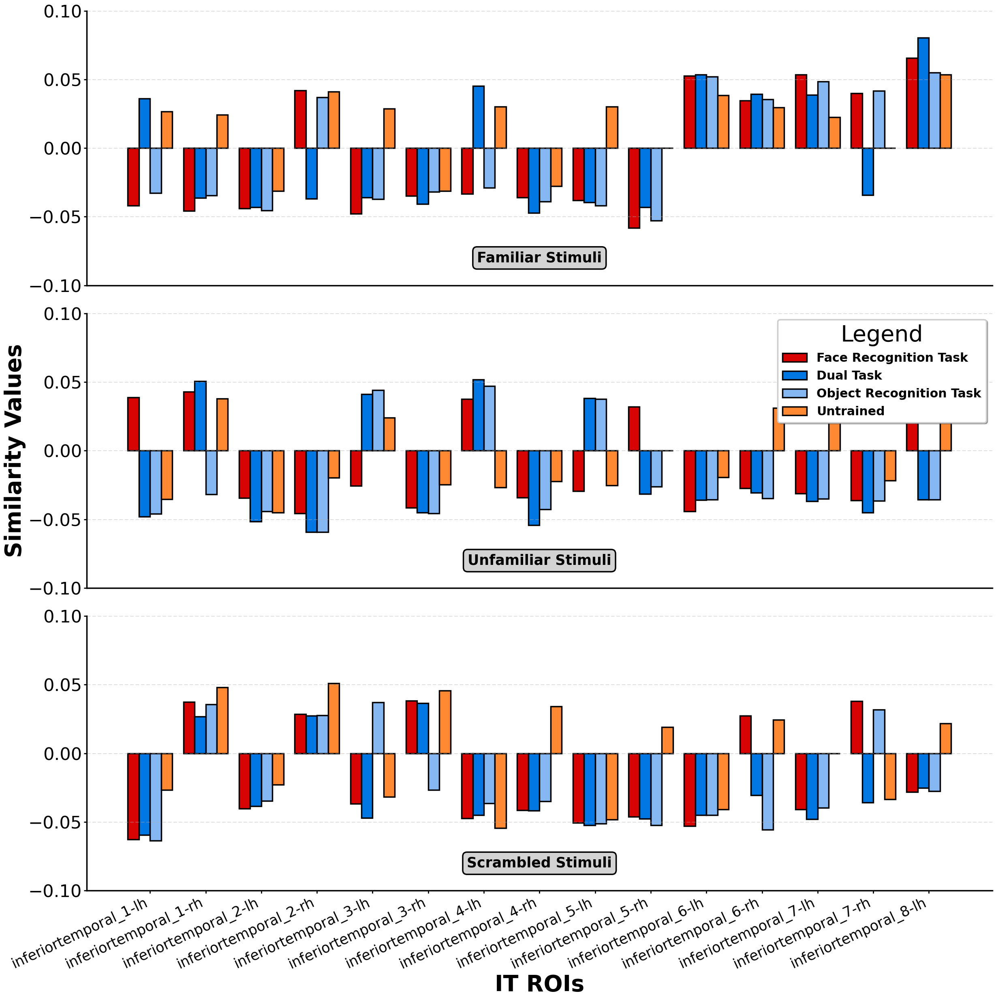

In [13]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]

time_segment = 550
sampling_diff = 50
colors = [one_piece[2],  pink_ocean[4], pink_ocean[7], one_piece[3],pink_ocean[-2], pink_ocean[-5], pink_ocean[-8]]
# colors = [one_piece[0], one_piece[2], one_piece[12], one_piece[-1]]
fig, ax = plt.subplots(3, 1, figsize=(25, 25))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        sim_values.append(values[inferiortemporal_labels])
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    axs[stimuli_idx].set_ylim(-0.10, 0.10)
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=40, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=40, title_fontsize=40, shadow=True, fancybox=True, prop={'weight':'bold'})
    axs[stimuli_idx].set_xticks(np.arange(len(inferiortemporal_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('IT ROIs', fontsize=40, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in inferiortemporal_labels], fontsize=25, rotation=25, ha="right")
    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)
        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        pass
        # axs[stimuli_idx].set_title(f'Similarity Values for IT ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].grid(axis="y", linestyle='--', alpha=0.7)
for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
plt.savefig(os.path.join(plots_folder, "final", f'FaceNet_IT_similarity_values.png'), dpi=300)
plt.show()

In [562]:
# Extract IT region data
inferiorparietal_labels = [i for i, label in enumerate(rois) if "inferiorparietal" in label.name.split('_')[0]]
region_name = [rois[i].name for i in inferiorparietal_labels]

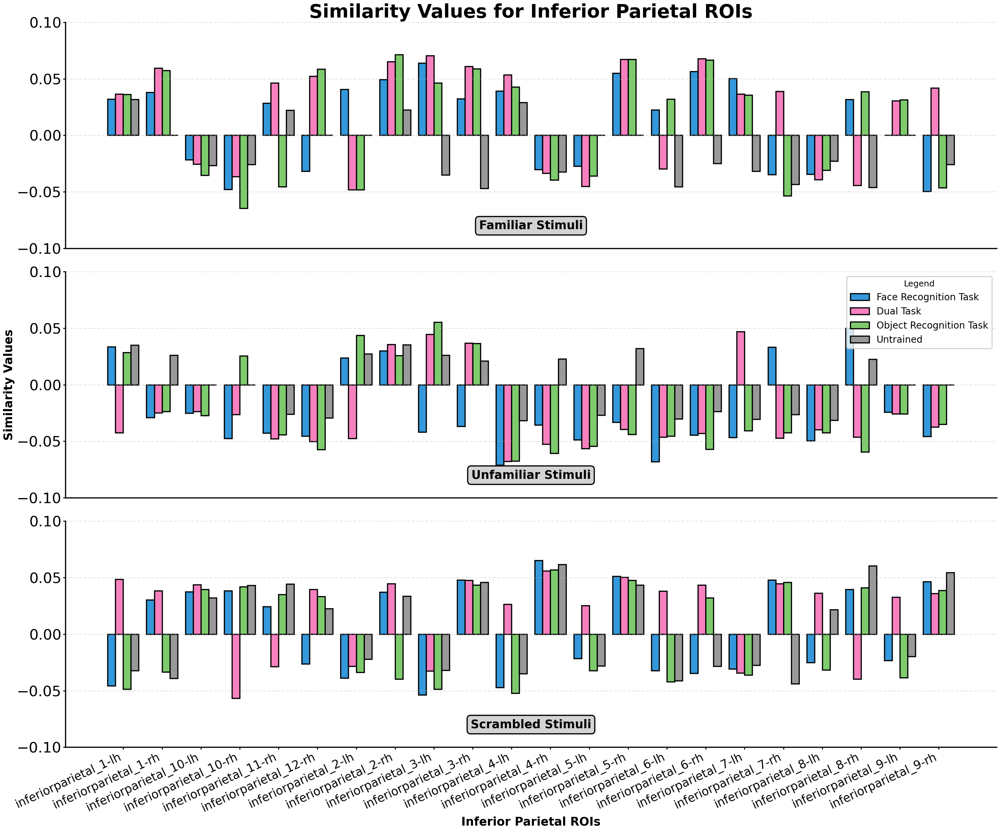

In [563]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]

time_segment = 550
sampling_diff = 50
colors = [the_blues[5], oppenheimer[5], green_bull[4], grey[2]]
# colors = [one_piece[0], one_piece[2], one_piece[12], one_piece[-1]]
fig, ax = plt.subplots(3, 1, figsize=(30, 25))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        sim_values.append(values[inferiorparietal_labels])
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    axs[stimuli_idx].set_ylim(-0.10, 0.10)
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=25, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=20)
    axs[stimuli_idx].set_xticks(np.arange(len(inferiorparietal_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('Inferior Parietal ROIs', fontsize=25, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in inferiorparietal_labels], fontsize=25, rotation=25, ha="right")
    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)
        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        axs[stimuli_idx].set_title(f'Similarity Values for Inferior Parietal ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].grid(axis="y", linestyle='--', alpha=0.7)
for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
plt.savefig(os.path.join(plots_folder, f'FaceNet_Inferior_Parietal_similarity_values.png'), dpi=300)
plt.show()

In [565]:
# Extract IT region data
unique_labels = []
for i, label in enumerate(rois):
    unique_labels.append(label.name.split('_')[0])
print(np.unique(unique_labels))

['bankssts' 'caudalanteriorcingulate' 'caudalmiddlefrontal' 'cuneus'
 'entorhinal' 'frontalpole' 'fusiform' 'inferiorparietal'
 'inferiortemporal' 'insula' 'isthmuscingulate' 'lateraloccipital'
 'lateralorbitofrontal' 'lingual' 'medialorbitofrontal' 'middletemporal'
 'paracentral' 'parahippocampal' 'parsopercularis' 'parsorbitalis'
 'parstriangularis' 'pericalcarine' 'postcentral' 'posteriorcingulate'
 'precentral' 'precuneus' 'rostralanteriorcingulate'
 'rostralmiddlefrontal' 'superiorfrontal' 'superiorparietal'
 'superiortemporal' 'supramarginal' 'temporalpole' 'transversetemporal'
 'unknown-lh' 'unknown-rh']


In [14]:
# Extract IT region data
bankssts_labels = [i for i, label in enumerate(rois) if "bankssts" in label.name.split('_')[0]]
region_name = [rois[i].name for i in bankssts_labels]

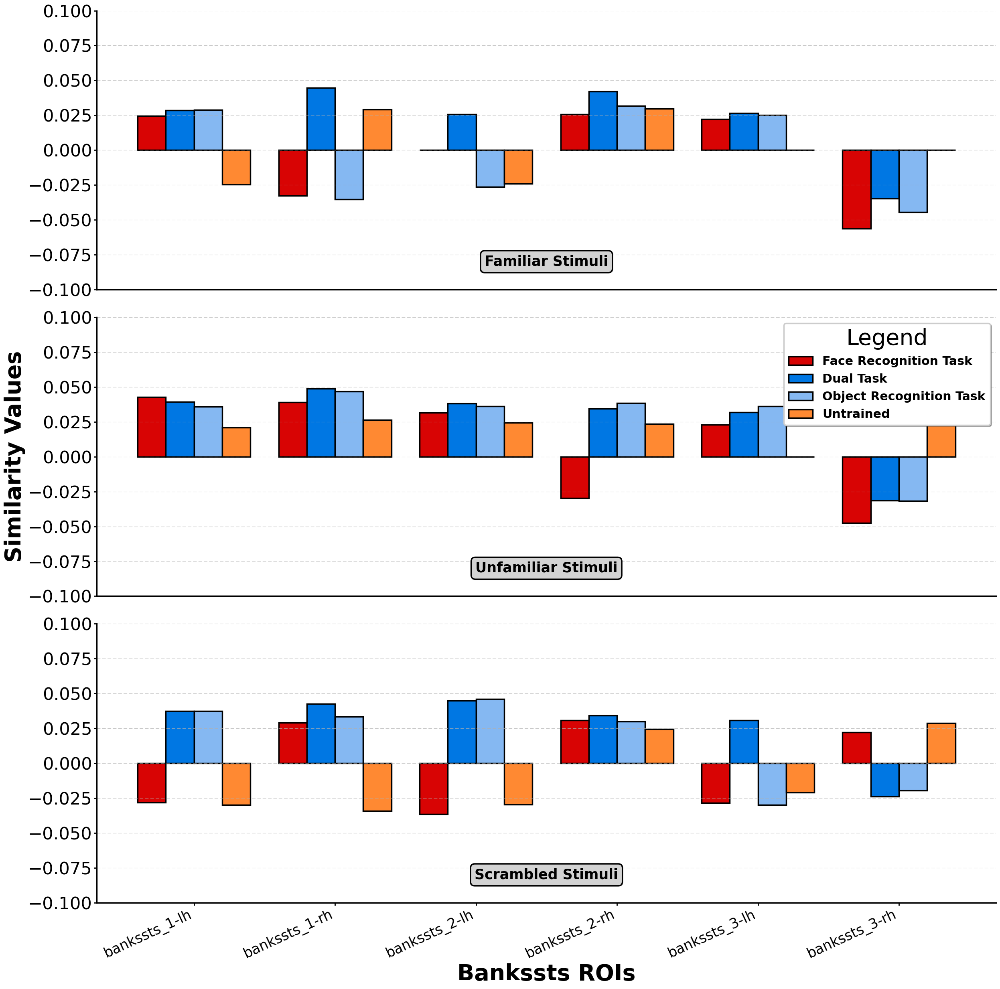

In [15]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]

time_segment = 550
sampling_diff = 50
colors = [one_piece[2],  pink_ocean[4], pink_ocean[7], one_piece[3],pink_ocean[-2], pink_ocean[-5], pink_ocean[-8]]
# colors = [one_piece[0], one_piece[2], one_piece[12], one_piece[-1]]
fig, ax = plt.subplots(3, 1, figsize=(25, 25))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        sim_values.append(values[bankssts_labels])
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    axs[stimuli_idx].set_ylim(-0.10, 0.10)
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=40, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=40, title_fontsize=40, shadow=True, fancybox=True, prop={'weight':'bold'})
    axs[stimuli_idx].set_xticks(np.arange(len(bankssts_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('Bankssts ROIs', fontsize=40, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in bankssts_labels], fontsize=25, rotation=25, ha="right")
    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)
        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        pass
        # axs[stimuli_idx].set_title(f'Similarity Values for Bankssts ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].grid(axis="y", linestyle='--', alpha=0.7)
for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
plt.savefig(os.path.join(plots_folder, "final",f'FaceNet_Inferior_bankssts_similarity_values.png'), dpi=300)
plt.show()

In [568]:
# Extract IT region data
middletemporal_labels = [i for i, label in enumerate(rois) if "middletemporal" in label.name.split('_')[0]]
region_name = [rois[i].name for i in middletemporal_labels]

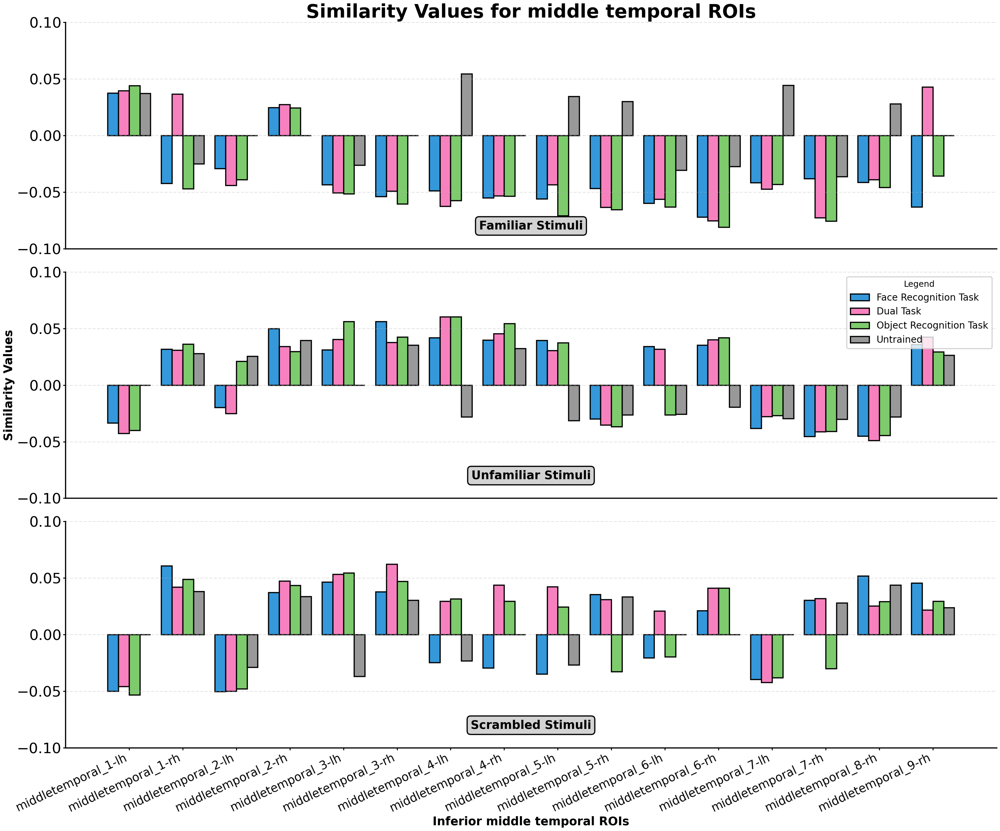

In [570]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]

time_segment = 550
sampling_diff = 50
colors = [the_blues[5], oppenheimer[5], green_bull[4], grey[2]]
# colors = [one_piece[0], one_piece[2], one_piece[12], one_piece[-1]]
fig, ax = plt.subplots(3, 1, figsize=(30, 25))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        sim_values.append(values[middletemporal_labels])
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    axs[stimuli_idx].set_ylim(-0.10, 0.10)
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=25, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=20)
    axs[stimuli_idx].set_xticks(np.arange(len(middletemporal_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('Inferior middle temporal ROIs', fontsize=25, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in middletemporal_labels], fontsize=25, rotation=25, ha="right")
    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)
        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        axs[stimuli_idx].set_title(f'Similarity Values for middle temporal ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].grid(axis="y", linestyle='--', alpha=0.7)
for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
plt.savefig(os.path.join(plots_folder, f'FaceNet_middletemporal_similarity_values.png'), dpi=300)
plt.show()

In [573]:
# END